# **Лабораторная работа 2**
*Naumov Anton (Any0019)*

*To contact me in telegram: @any0019*

В данном задании вашей задачей будет построить и обучить модель CycleGAN для задачи Img2Img.

---

Про задачу __Img2Img__:

- У вас есть 2 множества изображений ($A$ и $B$)
- Ваша задача - научиться превращать изображения из множества $A$ в изображения из множества $B$ и наоборот
- Бывают paired и unpaired множества
- В случае __paired__ множеств - для каждого изображения из $A$ существует конкретное изображение из $B$, в которое оно должно перейти (и наоборот). Примером такой пары множеств может быть (а) спутниковая фотграфия местности vs схематическая карта местности , (б) фотография фасада здания vs схема фасада здания , ...
- В случае __unpaired__ множеств - между множествами нет конкретных пар. Примером такой пары множеств может быть (а) фотографии с лошадьми vs фотографии с зебрами , (б) фотографии vs рисунки конкретного художника , ...

---

Про модель __CycleGAN__:

- Модель придумана для задачи Img2Img (в первую очередь unpaired версии) и основана на концепции GAN-ов
- В модели есть 2 генератора: $G_{A -> B}$ (задача которого - принимая на вход изображение из множества $A$ переводить его в изображение из множества $B$) и $G_{B -> A}$ (аналогично в другую сторону)
- Надо отметить что на вход генераторы не получают никакую дополнительную случайность, что делает обучение таких моделей проще
- В модели так же есть 2 дискриминатора: $D_{A}$ (задача которого - отличать реальные изображения из $A$ от сгенерированных с помощью $G_{B -> A}$ изображений) и $D_{B}$ (аналогично для $B$)
- Функцией ошибки будет, как и для GAN-ов, minmax игра между генераторами и дискриминаторами, но к ошибке генераторов добавится ещё и, так называемый, `cycle consistency loss`, который проверяет, что после двойного перехода изображения не меняются $G_{B -> A} \big( G_{A -> B} ( a ) \big) = a ; \forall a \in A$ и $G_{A -> B} \big( G_{B -> A} ( b ) \big) = b ; \forall b \in B$
- Так же можно добавлять или нет штраф за то, чтобы $G_{B -> A}$ не меняла изображения из $A$ и наоборот $G_{A -> B}$ не меняла изображения из $B$
- Оригинальная статья: https://arxiv.org/pdf/1703.10593.pdf

---

Ваша задача - ноутбук разбит на несколько частей, каждая со своими баллами

1. __Подготовка данных__ _(2 балла)_ --> требуется выбрать датасет для обучения (дано несколько на выбор) и составить пайплайн подготовки данных
2. __Составление модели__ _(6 баллов)_ --> требуется собрать нейросеть _(3 балла)_ и создать функции ошибки _(3 балла)_
3. __Подготовка обучения__ _(2 балла)_ --> требуется написать шаги обучения и валидации, визуализацию, а так же полный цикл обучения
4. __Обучение__ _(2 балла)_ --> требуется обучить модель
5. __Сбор своего датасета и обучение модели на нём__ _(3 балла)_ --> требуется собрать свой датасет и обучить на нём модель

***За наиболее интересные и качественные решения в пункте 5 так же предусмотрены дополнительные баллы***

In [1]:
import os
os.environ['PYTORCH_CUDA_ALLOC_CONF'] = 'max_split_size_mb:128'


import torch
import torch.nn as nn
import torch.nn.functional as F

from torch.utils.data import Dataset, DataLoader

from torchvision import datasets, transforms as tr

import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

# Для тёмной темы jupyter - уберите если не нужно

from tqdm.auto import tqdm, trange

import os
import sys
import requests
import cv2

from dataclasses import dataclass


# 1. Подготовка данных (___2 балла___)

## 1.1 Выбор и скачивание датасета

Dataset 'summer2winter_yosemite'
Loading zip file... --> done!
Unziping...

--2025-04-10 08:30:48--  http://efrosgans.eecs.berkeley.edu/cyclegan/datasets/summer2winter_yosemite.zip
Resolving efrosgans.eecs.berkeley.edu (efrosgans.eecs.berkeley.edu)... 128.32.244.190
Connecting to efrosgans.eecs.berkeley.edu (efrosgans.eecs.berkeley.edu)|128.32.244.190|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 132640856 (126M) [application/zip]
Saving to: ‘./datasets/img2img/summer2winter_yosemite.zip’

     0K .......... .......... .......... .......... ..........  0%  125K 17m16s
    50K .......... .......... .......... .......... ..........  0%  241K 13m7s
   100K .......... .......... .......... .......... ..........  0%  198M 8m44s
   150K .......... .......... .......... .......... ..........  0% 46.1K 18m15s
   200K .......... .......... .......... .......... ..........  0%  232M 14m36s
   250K .......... .......... .......... .......... ..........  0% 63.6K 17m49s
   300K .......... .......... .......... .......... ..........  0%  247K 16m

 --> done!
Provided splits: ['trainA', 'testB', 'trainB', 'testA']
Split 'testA' of dataset 'summer2winter_yosemite' --> size: 309


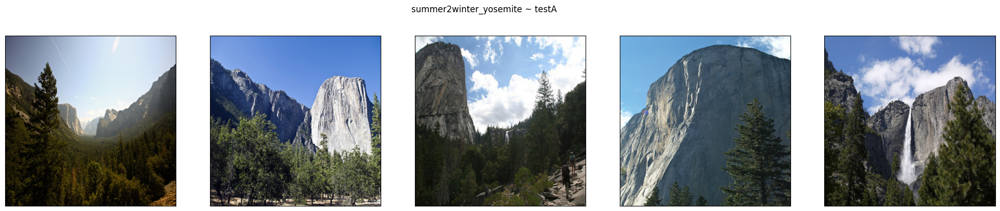

Split 'testB' of dataset 'summer2winter_yosemite' --> size: 238


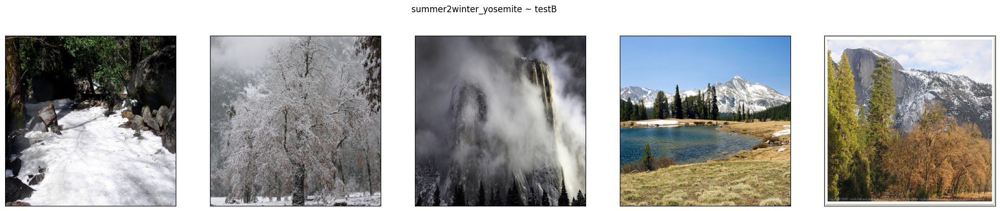

Split 'trainA' of dataset 'summer2winter_yosemite' --> size: 1231


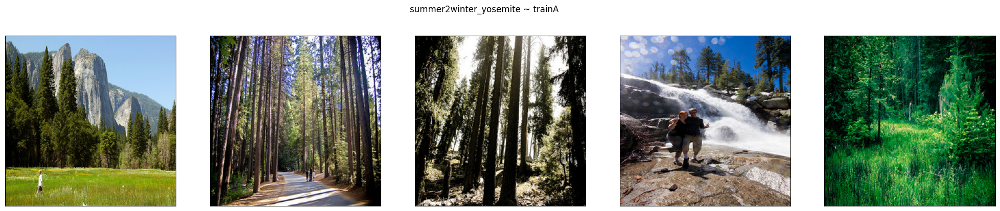

Split 'trainB' of dataset 'summer2winter_yosemite' --> size: 962


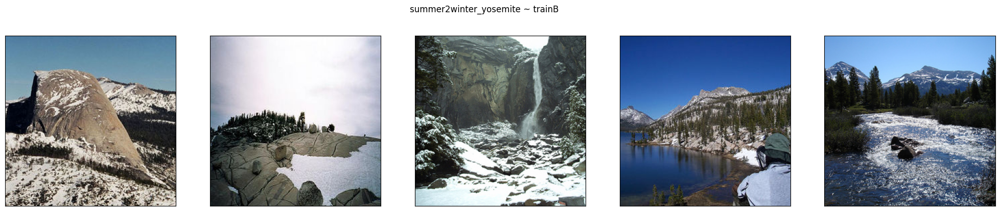


----------------------------



In [2]:
dataset_folder = "./datasets/img2img"
num_images_per_split = 5

os.environ["dataset_folder"] = dataset_folder
!mkdir -p ${dataset_folder}

# В этом цикле каждый из предложенных датасетов
#  - скачивается
#  - распаковывается
#  - отрисовывается + meta
#  - удаляется

# Предлагается посмотреть на все предложенные варианты датасетов и затем оставить один,
#  с которым захочется работать больше всего - закомментируйте (или удалите) все, кроме
#  выбранного, а так же закомментируйте строчки с удалением скачанного датасета
for dataset_name in [
    # Unpaired
    #"apple2orange",
    "summer2winter_yosemite",
    #"horse2zebra",
    #"monet2photo",
    #"cezanne2photo",
    #"ukiyoe2photo",
    #"vangogh2photo",
    # Paired
    #"maps",
    #"facades",
]:
    print(f"Dataset '{dataset_name}'")
    url = f"http://efrosgans.eecs.berkeley.edu/cyclegan/datasets/{dataset_name}.zip"
    download_path = os.path.join(dataset_folder, f"{dataset_name}.zip")
    target_folder = os.path.join(dataset_folder, dataset_name)
    
    # Чтобы bash вызовы знали соответствующие переменные
    os.environ["url"] = url
    os.environ["download_path"] = download_path
    os.environ["target_folder"] = target_folder
    
    print("Loading zip file...", end="")
    # Проверяем что нет такого загруженого файла
    if not os.path.isfile(download_path) or os.path.exists(target_folder):
        # # Можно загрузить через requests библиотеку
        # response = requests.get(url)
        # open(download_path, "wb").write(response.content)
        
        # Можно загрузить через wget
        !wget ${url} -O ${download_path}
    print(" --> done!")
    
    print("Unziping...", end="")
    # Распаковываем
    if os.path.exists(target_folder):
        !rm -r ${target_folder}
    !mkdir -p ${dataset_folder}
    !unzip -qq ${download_path} -d ${dataset_folder}
    print(" --> done!")
    
    # Удаляем zip-файл
    #!rm ${download_path}
    
    # Meta + Отрисовка
    print(f"Provided splits: {os.listdir(target_folder)}")
    # Удобный способ быстро получить датасет картинок с лэйблами, если картинки разложены по папкам в формате:
    # root_folder/label_name/img.jpg
    # (в нашем случае нет лэйблов, но картинки разложены в таком же формате, просто вместо label_name идёт
    #  split_name: trainA/testA/trainB/testB)
    dataset = datasets.ImageFolder(target_folder)

    inds_to_show = {i: [] for i, _ in enumerate(dataset.classes)}
    classes_full = 0
    for dataset_ind in range(len(dataset)):
        _, split_ind = dataset[dataset_ind]
        if len(inds_to_show[split_ind]) == num_images_per_split:
            continue
        inds_to_show[split_ind].append(dataset_ind)
        if len(inds_to_show[split_ind]) == num_images_per_split:
            classes_full += 1
        if classes_full == len(dataset.classes):
            break

    for split_name in sorted(dataset.classes):
        split_ind = dataset.class_to_idx[split_name]
        print(f"Split '{split_name}' of dataset '{dataset_name}'", end="")
        split_folder = os.path.join(target_folder, split_name)
        print(f" --> size: {len(os.listdir(split_folder))}")

        plt.subplots(1, num_images_per_split, figsize=(5 * num_images_per_split, 5))
        plt.suptitle(f"{dataset_name} ~ {split_name}", y=0.95)
        for i, dataset_ind in enumerate(inds_to_show[split_ind]):
            plt.subplot(1, num_images_per_split, i + 1)
            plt.imshow(dataset[dataset_ind][0])
            plt.xticks([])
            plt.yticks([])
        plt.show()
    
    # Удаляем скачанный датасет
    #!rm -r ${target_folder}
    
    print("\n----------------------------\n")

## 1.2 Dataset и Transforms

В папке `target_folder` находятся несколько папок со сплитами для соответствующего датасета, в каждой папке сплита находятся сами `.jpg` изображения.

Давайте составим их в удобном для нас виде в отдельные датасеты для каждого сплита без лэйблов.

Для получения картинок можно использовать 
```python
cv2.imread(img_path)[:, :, ::-1]  # каналы записаны в обратном порядке
```

In [2]:
# Выбранный выше и скачанный датасет
dataset_folder = "./datasets/img2img"
dataset_name = "summer2winter_yosemite"
target_folder = os.path.join(dataset_folder, dataset_name)

# Класс для датасета изображений без лэйблов с применением трансформов
class ImageDatasetNoLabel(Dataset):
    def __init__(self, folder_path, transform=None):
        super(ImageDatasetNoLabel).__init__()
        self.folder_path = folder_path
        self.image_paths = sorted([os.path.join(folder_path, file) for file in os.listdir(folder_path)])
        self.transform = transform

    def __getitem__(self, index):
        image_path = self.image_paths[index]
        image = cv2.imread(image_path)[:, :, ::-1]
        if self.transform:
            image = self.transform(image)

        return image
    
    def __len__(self):
        return len(self.image_paths)

# Удобный класс для хранения всех наших датасетов
@dataclass
class DatasetsClass:
    train_a: ImageDatasetNoLabel
    train_b: ImageDatasetNoLabel
    test_a: ImageDatasetNoLabel
    test_b: ImageDatasetNoLabel


# Все датасеты без трансформов - чтобы посчитать статистики
ds = DatasetsClass(
    train_a=ImageDatasetNoLabel(os.path.join(target_folder, "trainA")),
    train_b=ImageDatasetNoLabel(os.path.join(target_folder, "trainB")),
    test_a=ImageDatasetNoLabel(os.path.join(target_folder, "testA")),
    test_b=ImageDatasetNoLabel(os.path.join(target_folder, "testB")),
)

In [3]:
def get_channel_statistics(dataset):
    """
    Функция для получения поканальных статистик (среднее и отклонение) по датасету
    """
    channel_mean = np.zeros((3,))
    channel_std = np.zeros((3,))
    
    for img in dataset:
        img_float = img.astype(np.float32) / 255.0 
        channel_mean += np.mean(img_float, axis=(0, 1))
        channel_std += np.std(img_float, axis=(0, 1))
    
    number_imgs = len(dataset)
    channel_mean /= number_imgs
    channel_std /= number_imgs
    
    return channel_mean, channel_std
    
    return channel_mean, channel_std

# Поканальное среднее и отклонение для A
channel_mean_a, channel_std_a = get_channel_statistics(ds.train_a)
print(channel_mean_a, channel_std_a)

# Поканальное среднее и отклонение для B
channel_mean_b, channel_std_b = get_channel_statistics(ds.train_b)
print(channel_mean_b, channel_std_b)

[0.3850664  0.40989746 0.40582623] [0.23015783 0.22086328 0.25819781]
[0.40304117 0.42302073 0.45274811] [0.23486699 0.2328346  0.25871196]


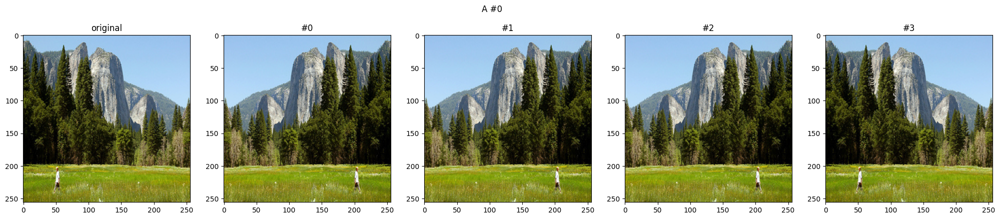

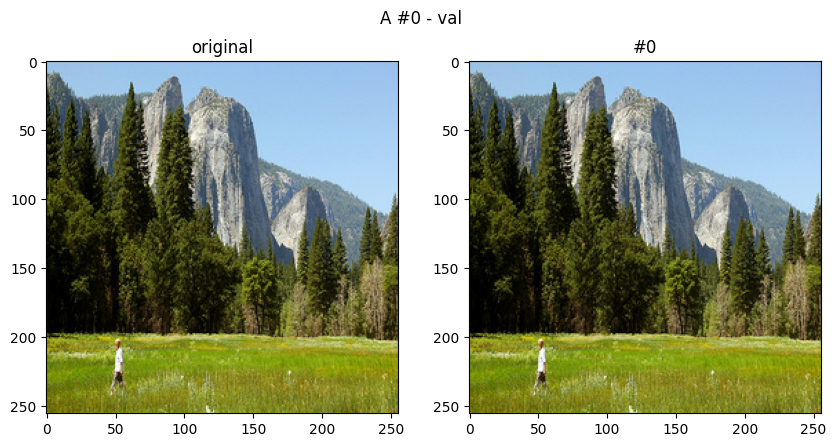

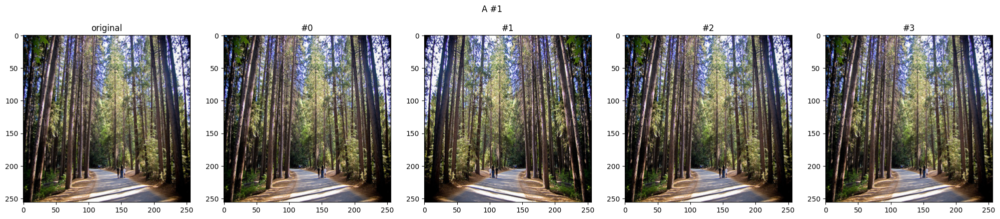

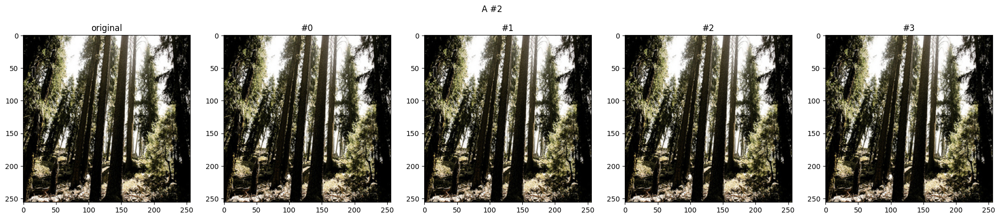

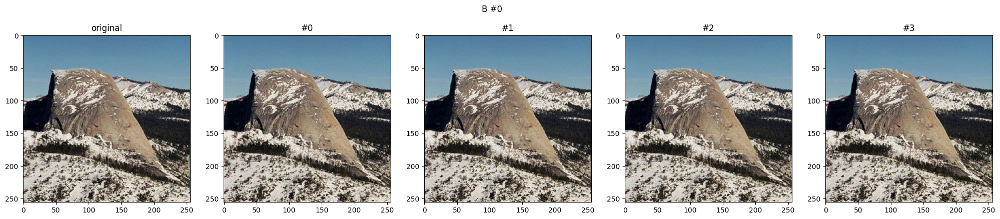

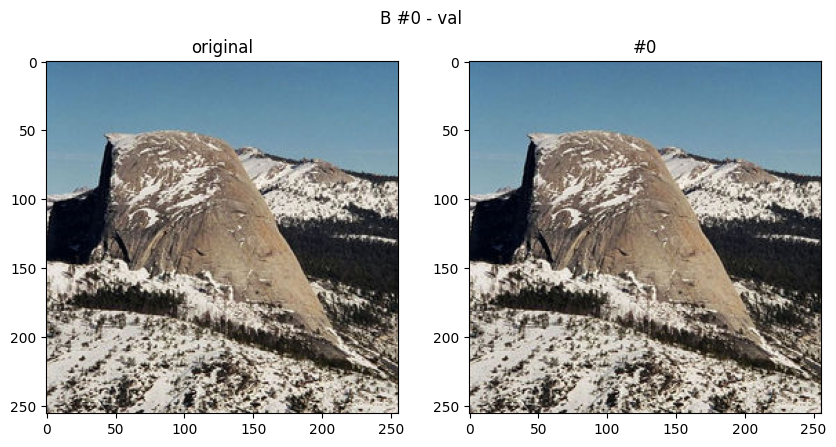

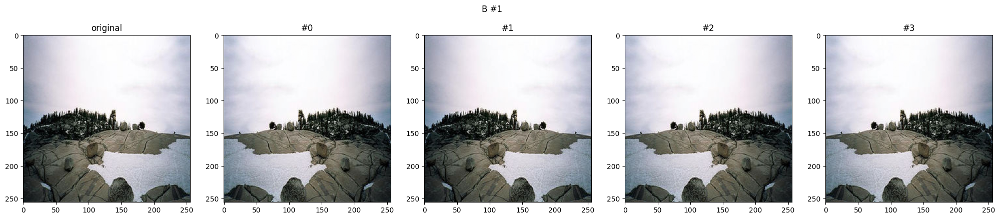

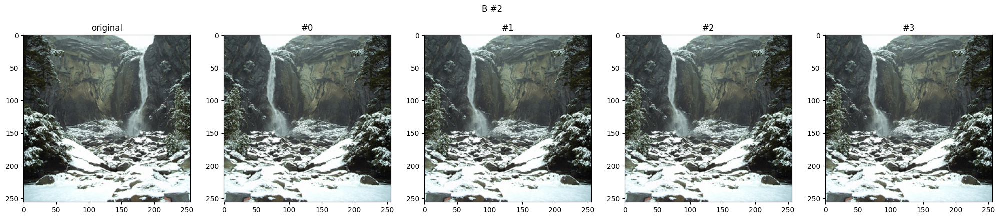

In [4]:
# Функция для получения train и val transform-ов, а так же функции для де-нормализации изображения
def get_transforms(mean, std, image_size):
    train_transform = tr.Compose([
        tr.ToPILImage(),  
        tr.Resize((image_size, image_size)),
        tr.RandomHorizontalFlip(),
        tr.ToTensor(),
        tr.Normalize(mean=mean, std=std) 
    ])
    
    val_transform = tr.Compose([
        tr.ToPILImage(), 
        tr.Resize((image_size, image_size)),
        tr.ToTensor(),
        tr.Normalize(mean=mean, std=std)
    ])
    
    def de_normalize(image):
        img_copy = image.clone().permute(1, 2, 0)

        for i in range(3):  
            img_copy[..., i] = img_copy[..., i] * std[i] + mean[i]
            
        img_copy = torch.clamp(img_copy, 0, 1)
        return img_copy
    
    return train_transform, val_transform, de_normalize


# Ваши гиперпараметры
hyperparams = dict(
    image_size=256,
)
# transform-ы для A и B
train_transform_a, val_transform_a, de_normalize_a = get_transforms(channel_mean_a, channel_std_a, **hyperparams)
train_transform_b, val_transform_b, de_normalize_b = get_transforms(channel_mean_b, channel_std_b, **hyperparams)


# Функция для визуализации transform-ов
def show_examples(dataset, transform, de_norm, num_per_image=3, image_index=0, title=""):
    fig, ax = plt.subplots(1, 1 + num_per_image, figsize=(5 * (1 + num_per_image), 5))
    
    image = dataset[image_index]
    
    plt.suptitle(title, y=0.95)

    plt.subplot(1, 1 + num_per_image, 1)
    plt.imshow(image)
    plt.title("original")

    for i in range(num_per_image):
        plt.subplot(1, 1 + num_per_image, i + 2)
        plt.title(f"#{i}")
        plt.imshow(de_norm(transform(image)))
    plt.show()

# Проверка на адекватность
show_examples(ds.train_a, train_transform_a, de_normalize_a, num_per_image=4, image_index=0, title="A #0")
show_examples(ds.train_a, val_transform_a, de_normalize_a, num_per_image=1, image_index=0, title="A #0 - val")
show_examples(ds.train_a, train_transform_a, de_normalize_a, num_per_image=4, image_index=1, title="A #1")
show_examples(ds.train_a, train_transform_a, de_normalize_a, num_per_image=4, image_index=2, title="A #2")
show_examples(ds.train_b, train_transform_b, de_normalize_b, num_per_image=4, image_index=0, title="B #0")
show_examples(ds.train_b, val_transform_b, de_normalize_b, num_per_image=1, image_index=0, title="B #0 - val")
show_examples(ds.train_b, train_transform_b, de_normalize_b, num_per_image=4, image_index=1, title="B #1")
show_examples(ds.train_b, train_transform_b, de_normalize_b, num_per_image=4, image_index=2, title="B #2")

In [5]:
# Все датасеты с трансформами
ds = DatasetsClass(
    train_a=ImageDatasetNoLabel(
        os.path.join(target_folder, "trainA"),
        transform=train_transform_a,
    ),
    train_b=ImageDatasetNoLabel(
        os.path.join(target_folder, "trainB"),
        transform=val_transform_b,
    ),
    test_a=ImageDatasetNoLabel(
        os.path.join(target_folder, "testA"),
        transform=val_transform_a,
    ),
    test_b=ImageDatasetNoLabel(
        os.path.join(target_folder, "testB"),
        transform=val_transform_b,
    ),
)

## 1.3 DataLoader

In [6]:
@dataclass
class DataLoadersClass:
    train_a: DataLoader
    train_b: DataLoader
    test_a: DataLoader
    test_b: DataLoader

batch_size = 8
num_workers = 8

dataloaders = DataLoadersClass(
    train_a=DataLoader(
        dataset=ds.train_a,
        batch_size=batch_size,
        shuffle=True,
        drop_last=True,
        num_workers=num_workers,
    ),
    train_b=DataLoader(
        dataset=ds.train_b,
        batch_size=batch_size,
        shuffle=True,
        drop_last=True,
        num_workers=num_workers,
    ),
    test_a=DataLoader(
        dataset=ds.test_a,
        batch_size=batch_size,
        shuffle=False,
        drop_last=True,
        num_workers=num_workers,
    ),
    test_b=DataLoader(
        dataset=ds.test_b,
        batch_size=batch_size,
        shuffle=False,
        drop_last=True,
        num_workers=num_workers,
    ),
)

# 2. Модель (___6 баллов___)

## 2.0 Любые вспомогательные модули и классы

In [7]:
import torch
import torch.nn as nn
from typing import List

class ConvolutionalBlock(nn.Module):
    def __init__(
        self,
        in_channels: int,
        out_channels: int,
        is_downsampling: bool = True,
        add_activation: bool = True,
        **kwargs
    ):
        super().__init__()
        if is_downsampling:
            self.conv = nn.Sequential(
                nn.Conv2d(in_channels, out_channels, padding_mode="reflect", **kwargs),
                nn.InstanceNorm2d(out_channels),
                nn.ReLU(inplace=True) if add_activation else nn.Identity(),
            )
        else:
            self.conv = nn.Sequential(
                nn.ConvTranspose2d(in_channels, out_channels, **kwargs),
                nn.InstanceNorm2d(out_channels),
                nn.ReLU(inplace=True) if add_activation else nn.Identity(),
            )

    def forward(self, x):
        return self.conv(x)

class ResidualBlock(nn.Module):
    def __init__(self, channels: int):
        super().__init__()
        self.block = nn.Sequential(
            ConvolutionalBlock(channels, channels, add_activation=True, kernel_size=3, padding=1),
            ConvolutionalBlock(channels, channels, add_activation=False, kernel_size=3, padding=1),
        )

    def forward(self, x):
        return x + self.block(x)

class Encoder(nn.Module):
    def __init__(self, input_channels: int, num_features: int):
        super().__init__()
        self.model = nn.Sequential(
            nn.Conv2d(input_channels, num_features, kernel_size=7, stride=1, padding=3),
            nn.InstanceNorm2d(num_features),
            nn.ReLU(inplace=True),
            nn.Conv2d(num_features, num_features * 2, kernel_size=3, stride=2, padding=1),
            nn.InstanceNorm2d(num_features * 2),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        x = self.model(x)
        return x

class Decoder(nn.Module):
    def __init__(self, input_channels: int, num_features: int, output_channels: int):
        super().__init__()
        self.model = nn.Sequential(
            nn.ConvTranspose2d(num_features * 2, num_features, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.InstanceNorm2d(num_features),
            nn.ReLU(inplace=True),
            nn.Conv2d(num_features, output_channels, kernel_size=7, stride=1, padding=3),
            nn.Tanh()
        )

    def forward(self, x):
        x = self.model(x)
        return x

class Generator(nn.Module):
    def __init__(
        self,
        input_channels: int,
        output_channels: int,
        num_residual_blocks: int,
        num_features: int = 64
    ):
        super(Generator, self).__init__()
        self.encoder = Encoder(input_channels, num_features)
        res_blocks = []
        for _ in range(num_residual_blocks):
            res_blocks.append(ResidualBlock(num_features * 2))  # Удваиваем каналы для residual блоков
        self.residual_blocks = nn.Sequential(*res_blocks)
        self.decoder = Decoder(num_features * 2, num_features, output_channels)  # Изменяем размерность

    def forward(self, x):
        x = self.encoder(x)
        x = self.residual_blocks(x)
        x = self.decoder(x)
        return x


class Discriminator(nn.Module):
    def __init__(self, input_channels: int, disc_features: List[int]):
        super(Discriminator, self).__init__()
        layers = []
        in_channels = input_channels
        for out_channels in disc_features:
            layers.append(
                nn.Conv2d(in_channels, out_channels, kernel_size=4, stride=2, padding=1)
            )
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            in_channels = out_channels
        layers.append(
            nn.Conv2d(in_channels, 1, kernel_size=4, stride=1, padding=1)
        )
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        return self.model(x)


## 2.1 Архитектура сети (___3 балла___)

In [8]:
class CycleGAN(nn.Module):
    def __init__(
        self,
        input_channels: int,
        output_channels: int,
        num_residual_blocks: int,
        num_features: int = 64,
        disc_features: List[int] = [64, 128, 256, 512]
    ):
        super(CycleGAN, self).__init__()
        # Генераторы для преобразования изображений
        self.generator_a = Generator(input_channels, output_channels, num_residual_blocks, num_features)
        self.generator_b = Generator(input_channels, output_channels, num_residual_blocks, num_features)
        # Дискриминаторы для классификации изображений
        self.discriminator_a = Discriminator(input_channels, disc_features)
        self.discriminator_b = Discriminator(input_channels, disc_features)

    def forward(self, real_a, real_b):
        # Прямой проход через генераторы
        fake_b = self.generator_a(real_a)
        fake_a = self.generator_b(real_b)
        # Обратный проход через генераторы
        rec_a = self.generator_b(fake_b)
        rec_b = self.generator_a(fake_a)
        # Предсказания дискриминаторов для реальных и фейковых изображений
        pred_real_a = self.discriminator_a(real_a)
        pred_fake_a = self.discriminator_a(fake_a)
        pred_real_b = self.discriminator_b(real_b)
        pred_fake_b = self.discriminator_b(fake_b)
        return fake_b, fake_a, rec_a, rec_b, pred_real_a, pred_fake_a, pred_real_b, pred_fake_b

    def generator_parameters(self):
        # Возвращает параметры обоих генераторов
        return list(self.generator_a.parameters()) + list(self.generator_b.parameters())

    def discriminator_parameters(self):
        # Возвращает параметры обоих дискриминаторов
        return list(self.discriminator_a.parameters()) + list(self.discriminator_b.parameters())

## 2.2 Loss (___3 балла___)

$$ \mathbf{L}_{\text{cyc}} \big( G_{A \rightarrow B}, G_{B \rightarrow A} \big) = \mathbb{E}_{a \sim A} \bigg( \Big\| G_{B \rightarrow A} \big( G_{A \rightarrow B} ( a ) \big) - a \Big\|_1 \bigg) + \mathbb{E}_{b \sim B} \bigg( \Big\| G_{A \rightarrow B} \big( G_{B \rightarrow A} ( b ) \big) - b \Big\|_1 \bigg) \longrightarrow \min_{G}$$

In [9]:
class CycleConsistencyLoss(nn.Module):
    """
    Функция ошибки, проверяющая что после двойного перехода через генераторы изображение не изменилось
    """
    def __init__(self):
        super(CycleConsistencyLoss, self).__init__()
    
    def forward(self, x, x_rec):
        # Принимает на вход оригинальное изображение и изображение после двойного перехода
        loss = nn.L1Loss()
        return loss(x, x_rec)


$$ \mathbf{L}_{\text{GAN}} \big( G_{A \rightarrow B}, D_{B} \big) = \mathbb{E}_{b \sim B} \log D_{B} (b) + \mathbb{E}_{a \sim A} \log \Big( 1 - D_{B} \big( G_{A \rightarrow B} (a) \big) \Big) \longrightarrow \min_{G} \max_{D}$$

In [10]:
import torch.nn as nn

class AdversarialLossCE(nn.Module):
    """
    Стандартная функция ошибки для минимакс игры GAN-ов с использованием бинарной кросс-энтропии
    """
    def __init__(self):
        super(AdversarialLossCE, self).__init__()
        self.loss = nn.BCEWithLogitsLoss()
    
    def forward(self, real_pred, fake_pred=None):
        # Принимает на вход D_{A}(a) - real_pred и D_{A}(G(b)) - fake_pred или наоборот
        # Может принимать только один аргумент для удобства использования в случае
        # обучения генератора или дискриминатора
        if fake_pred is None:
            return self.loss(real_pred, torch.ones_like(real_pred))
        else:
            real_loss = self.loss(real_pred, torch.ones_like(real_pred))
            fake_loss = self.loss(fake_pred, torch.zeros_like(fake_pred))
            return (real_loss + fake_loss) / 2


$$ \mathbb{E}_{b \sim B} \big( D_{B} (b) - 1 \big)^2 + \mathbb{E}_{a \sim A} \Big( D_{B} \big( G_{A \rightarrow B} (a) \big) \Big)^2 \longrightarrow \min_{D} $$
$$ \mathbb{E}_{a \sim A} \Big( D_{B} \big( G_{A \rightarrow B} (a) \big) - 1 \Big)^2 \longrightarrow \min_{G} $$

In [11]:
class AdversarialLossMSE(nn.Module):
    """
    Функция ошибки для минимизации MSE между предсказаниями дискриминатора и целевыми значениями
    """
    def __init__(self):
        super(AdversarialLossMSE, self).__init__()
    
    def forward(self, real_pred, fake_pred=None):
        # Принимает на вход D_{A}(a) - real_pred и D_{A}(G(b)) - fake_pred или наоборот
        # Может принимать только один аргумент для удобства использования в случае
        # обучения генератора или дискриминатора
        if fake_pred is None:
            return torch.mean((real_pred - 1) ** 2)
        else:
            real_loss = torch.mean((real_pred - 1) ** 2)
            fake_loss = torch.mean(fake_pred ** 2)
            return (real_loss + fake_loss) / 2

$$ \mathbf{L} \big( G_{A \rightarrow B}, G_{B \rightarrow A}, D_{A}, D_{B} \big) = \mathbf{L}_{\text{GAN}} \big( G_{A \rightarrow B}, D_{B} \big) + \mathbf{L}_{\text{GAN}} \big( G_{B \rightarrow A}, D_{A} \big) + \lambda \cdot \mathbf{L}_{\text{cyc}} \big( G_{A \rightarrow B}, G_{B \rightarrow A} \big) \longrightarrow \min_{G} \max_{D}$$

In [12]:
import torch.nn as nn

class FullDiscriminatorLoss(nn.Module):
    def __init__(self, is_mse=True):
        super().__init__()
        self.is_mse = is_mse
    
    def forward(self, pred_real_a, pred_fake_a, pred_real_b, pred_fake_b, target_real, target_fake):
        if self.is_mse:
            target_real_resized = F.interpolate(target_real, size=(pred_real_a.size(2), pred_real_a.size(3)), mode='nearest')
            target_fake_resized = F.interpolate(target_fake, size=(pred_fake_a.size(2), pred_fake_a.size(3)), mode='nearest')
            loss_d_real_a = F.mse_loss(pred_real_a, target_real_resized)
            loss_d_fake_a = F.mse_loss(pred_fake_a, target_fake_resized)
            loss_d_real_b = F.mse_loss(pred_real_b, target_real_resized)
            loss_d_fake_b = F.mse_loss(pred_fake_b, target_fake_resized)
            loss_d = (loss_d_real_a + loss_d_fake_a + loss_d_real_b + loss_d_fake_b) / 4
            return loss_d


In [13]:
import torch.nn.functional as F

class FullGeneratorLoss(nn.Module):
    def __init__(self, lambda_value, is_mse=True):
        super().__init__()
        self.lambda_value = lambda_value
        self.is_mse = is_mse
    
    def forward(self, pred_fake_a, pred_fake_b, real_imgs_a, real_imgs_b, reconstructed_a, reconstructed_b):
        if self.is_mse:
            criterion = F.mse_loss
        else:
            criterion = F.binary_cross_entropy_with_logits
        
        adv_loss_a = criterion(pred_fake_a, torch.ones_like(pred_fake_a))
        adv_loss_b = criterion(pred_fake_b, torch.ones_like(pred_fake_b))
        
        cycle_loss_a = criterion(reconstructed_a, real_imgs_a)
        cycle_loss_b = criterion(reconstructed_b, real_imgs_b)
        
        total_loss = adv_loss_a + adv_loss_b + self.lambda_value * (cycle_loss_a + cycle_loss_b)
        
        return total_loss


# 3. Подготовка обучения (__2 балла__)

## 3.1 Шаг обучения дискриминатора

In [14]:
def train_discriminators(model, opt_d, loader_a, loader_b, criterion_d):
    model.train()
    loss_d_total = 0.0
    
    for (imgs_a, imgs_b) in zip(loader_a, loader_b):
        imgs_a = imgs_a.to(device)
        imgs_b = imgs_b.to(device)
        
        opt_d.zero_grad()
        
        batch_size = imgs_a.size(0)
        target_real = torch.ones(batch_size, 1, 30, 30).to(device)
        target_fake = torch.zeros(batch_size, 1, 30, 30).to(device)
        
        pred_real_a = model.discriminator_a(imgs_a)
        pred_fake_a = model.discriminator_a(model.generator_a(imgs_b).detach())
        pred_real_b = model.discriminator_b(imgs_b)
        pred_fake_b = model.discriminator_b(model.generator_b(imgs_a).detach())
        
        loss_d = criterion_d(pred_real_a, pred_fake_a, pred_real_b, pred_fake_b, target_real, target_fake)
        
        loss_d_total += loss_d.item()
        
        loss_d.backward()
        opt_d.step()

    
    return model, opt_d, loss_d_total / len(loader_a)


## 3.2 Шаг обучения генератора

In [15]:
def train_generators(model, opt_g, loader_a, loader_b, criterion_g):
    model.train()
    loss_g_total = 0.0
    
    for (imgs_a, imgs_b) in zip(loader_a, loader_b):
        imgs_a = imgs_a.to(device)
        imgs_b = imgs_b.to(device)
        
        opt_g.zero_grad()
        
        fake_b, fake_a, rec_a, rec_b, pred_real_a, pred_fake_a, pred_real_b, pred_fake_b = model(imgs_a, imgs_b)
        
        loss_g_a = criterion_g(pred_fake_a, pred_fake_b, imgs_a, imgs_b, rec_a, rec_b)
        loss_g_b = criterion_g(pred_fake_b, pred_fake_a, imgs_b, imgs_a, rec_b, rec_a)
        
        loss_g = loss_g_a + loss_g_b
        loss_g_total += loss_g.item()
        
        loss_g.backward()
        opt_g.step()
    
    return model, opt_g, loss_g_total / len(loader_a)


## 3.3 Шаг валидации

In [16]:
from collections import defaultdict
def val(model, loader_a, loader_b, criterion_d, criterion_g):
    model.eval()
    total_loss_d = 0.0
    total_loss_g = 0.0
    real_pred_a_hist = []
    fake_pred_a_hist = []
    real_pred_b_hist = []
    fake_pred_b_hist = []

    for (imgs_a, imgs_b) in zip(loader_a, loader_b):
        imgs_a = imgs_a.to(device)
        imgs_b = imgs_b.to(device)

        with torch.no_grad():
            fake_b, fake_a, rec_a, rec_b, pred_real_a, pred_fake_a, pred_real_b, pred_fake_b = model(imgs_a, imgs_b)

            loss_d = criterion_d(pred_real_a, pred_fake_a, pred_real_b, pred_fake_b, torch.ones_like(pred_real_a), torch.zeros_like(pred_real_a))

            loss_g = criterion_g(pred_fake_a, pred_fake_b, imgs_a, imgs_b, rec_a, rec_b)

        total_loss_d += loss_d.item()
        total_loss_g += loss_g.item()

        real_pred_a_hist.extend(pred_real_a.cpu().detach().numpy().flatten())
        fake_pred_a_hist.extend(pred_fake_a.cpu().detach().numpy().flatten())
        real_pred_b_hist.extend(pred_real_b.cpu().detach().numpy().flatten())
        fake_pred_b_hist.extend(pred_fake_b.cpu().detach().numpy().flatten())

    avg_loss_d = total_loss_d / len(loader_a)
    avg_loss_g = total_loss_g / len(loader_a)

    return {
        "loss D": avg_loss_d,
        "loss G": avg_loss_g,
        "real pred A": real_pred_a_hist,
        "fake pred A": fake_pred_a_hist,
        "real pred B": real_pred_b_hist,
        "fake pred B": fake_pred_b_hist
    }

## 3.4 Визуализация сгенерированного

In [17]:
def draw_imgs(model, num_images, loader_a, loader_b, de_norm_a, de_norm_b):
    model.eval()
    with torch.no_grad():
        imgs_a = next(iter(loader_a))[:num_images].to(device)
        imgs_b = next(iter(loader_b))[:num_images].to(device)
        
        fake_b, fake_a, rec_a, rec_b, _, _, _, _ = model(imgs_a, imgs_b)
        
        # Move tensors to CPU
        imgs_a = imgs_a.cpu()
        imgs_b = imgs_b.cpu()
        fake_b = fake_b.cpu()
        fake_a = fake_a.cpu()
        rec_a = rec_a.cpu()
        rec_b = rec_b.cpu()
        
        # Draw num_images examples for A
        fig, ax = plt.subplots(num_images, 3, figsize=(25, 15))
        plt.suptitle("Images from A", y=0.92)
        
        for ind in range(num_images):
            plt.subplot(num_images, 3, ind * 3 + 1)
            plt.title("Original from A")
            plt.imshow(de_norm_a(imgs_a[ind]))
            plt.xticks([])
            plt.yticks([])
            
            plt.subplot(num_images, 3, ind * 3 + 2)
            plt.title("Translated to B")
            plt.imshow(de_norm_b(fake_b[ind]))
            plt.xticks([])
            plt.yticks([])
            
            plt.subplot(num_images, 3, ind * 3 + 3)
            plt.title("Reconstructed A")
            plt.imshow(de_norm_a(rec_a[ind]))
            plt.xticks([])
            plt.yticks([])
        
        plt.show()

        # Draw num_images examples for B
        fig, ax = plt.subplots(num_images, 3, figsize=(25, 15))
        plt.suptitle("Images from B", y=0.92)
        
        for ind in range(num_images):
            plt.subplot(num_images, 3, ind * 3 + 1)
            plt.title("Original from B")
            plt.imshow(de_norm_b(imgs_b[ind]))
            plt.xticks([])
            plt.yticks([])
            
            plt.subplot(num_images, 3, ind * 3 + 2)
            plt.title("Translated to A")
            plt.imshow(de_norm_a(fake_a[ind]))
            plt.xticks([])
            plt.yticks([])
            
            plt.subplot(num_images, 3, ind * 3 + 3)
            plt.title("Reconstructed B")
            plt.imshow(de_norm_b(rec_b[ind]))
            plt.xticks([])
            plt.yticks([])
    
        plt.show()


## 3.5 Цикл обучения

In [18]:
from IPython.display import clear_output
import warnings

def get_model_name(chkp_folder, model_name=None):
    # Выбираем имя чекпоинта для сохранения
    if model_name is None:
        if os.path.exists(chkp_folder):
            num_starts = len(os.listdir(chkp_folder)) + 1
        else:
            num_starts = 1
        model_name = f'model#{num_starts}'
    else:
        if "#" not in model_name:
            model_name += "#0"
    changed = False
    while os.path.exists(os.path.join(chkp_folder, model_name + '.pt')):
        model_name, ind = model_name.split("#")
        model_name += f"#{int(ind) + 1}"
        changed=True
    if changed:
        warnings.warn(f"Selected model_name was used already! To avoid possible overwrite - model_name changed to {model_name}")
    return model_name


def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']


def learning_loop(
    model,
    optimizer_g,
    g_iters_per_epoch,
    optimizer_d,
    d_iters_per_epoch,
    train_loader_a,
    train_loader_b,
    val_loader_a,
    val_loader_b,
    criterion_d,
    criterion_g,
    de_norm_a,
    de_norm_b,
    scheduler_d=None,
    scheduler_g=None,
    min_lr=None,
    epochs=10,
    val_every=1,
    draw_every=1,
    model_name=None,
    chkp_folder="./chkps",
    images_per_validation=3,
    plots=None,
    starting_epoch=0,
):
    model_name = get_model_name(chkp_folder, model_name)
    
    if plots is None:
        plots = {
            'train G': [],
            'train D': [],
            'val D': [],
            'val G': [],
            "lr G": [],
            "lr D": [],
            "hist real A": [],
            "hist gen A": [],
            "hist real B": [],
            "hist gen B": [],
        }

    for epoch in np.arange(1, epochs+1) + starting_epoch:
        print(f'#{epoch}/{epochs}:')

        plots['lr G'].append(get_lr(optimizer_g))
        plots['lr D'].append(get_lr(optimizer_d))
        
        # train discriminators
        print(f"train discriminators ({d_iters_per_epoch} times)")
        loss_d = []
        for _ in range(d_iters_per_epoch):
            model, optimizer_d, loss = train_discriminators(model, optimizer_d, train_loader_a, train_loader_b, criterion_d)
            loss_d.append(loss)
        plots['train D'].extend(loss_d)
        
        # train generators
        print(f"train generators ({g_iters_per_epoch} times)")
        loss_g = []
        for _ in range(g_iters_per_epoch):
            model, optimizer_g, loss = train_generators(model, optimizer_g, train_loader_a, train_loader_b, criterion_g)
            loss_g.append(loss)
        plots['train G'].extend(loss_g)

        if not (epoch % val_every):
            print("validate")
            val_data = val(model, val_loader_a, val_loader_b, criterion_d, criterion_g)
            plots['val D'].append(val_data["loss D"])
            plots['val G'].append(val_data["loss G"])
            plots['hist real A'].append(val_data["real pred A"])
            plots['hist gen A'].append(val_data["fake pred A"])
            plots['hist real B'].append(val_data["real pred B"])
            plots['hist gen B'].append(val_data["fake pred B"])
            
            # Сохраняем модель
            if not os.path.exists(chkp_folder):
                os.makedirs(chkp_folder)
            torch.save(
                {
                    'epoch': epoch,
                    'model_state_dict': model.state_dict(),
                    'optimizer_d_state_dict': optimizer_d.state_dict(),
                    'optimizer_g_state_dict': optimizer_g.state_dict(),
                    'scheduler_d_state_dict': scheduler_d.state_dict(),
                    'scheduler_g_state_dict': scheduler_g.state_dict(),
                    'plots': plots,
                },
                os.path.join(chkp_folder, model_name + '.pt'),
            )
            
            # Шедулинг
            if scheduler_d:
                try:
                    scheduler_d.step()
                except:
                    scheduler_d.step(loss_d)
            if scheduler_g:
                try:
                    scheduler_g.step()
                except:
                    scheduler_g.step(loss_g)

        if not (epoch % draw_every):
            clear_output(True)
            
            hh = 2
            ww = 2
            plt_ind = 1
            fig, ax = plt.subplots(hh, ww, figsize=(25, 12))
            fig.suptitle(f'#{epoch}/{epochs}:')

            plt.subplot(hh, ww, plt_ind)
            plt.title('discriminators losses')
            d_plot_step = 1. / d_iters_per_epoch
            plt.plot(np.arange(d_plot_step, epoch + d_plot_step, d_plot_step), plots['train D'], 'r.-', label='train', alpha=0.7)
            plt.plot(np.arange(1, epoch + 1), plots['val D'], 'g.-', label='val', alpha=0.7)
            plt.grid()
            plt.legend()
            plt_ind += 1
            
            plt.subplot(hh, ww, plt_ind)
            plt.title('generators losses')
            g_plot_step = 1. / g_iters_per_epoch
            plt.plot(np.arange(g_plot_step, epoch + g_plot_step, g_plot_step), plots['train G'], 'r.-', label='train', alpha=0.7)
            plt.plot(np.arange(1, epoch + 1), plots['val G'], 'g.-', label='val', alpha=0.7)
            plt.grid()
            plt.legend()
            plt_ind += 1
            
            # plt.subplot(hh, ww, plt_ind)
            # plt.title('learning rates')
            # plt.plot(plots["lr D"], 'b.-', label='lr discriminator', alpha=0.7)
            # plt.plot(plots["lr G"], 'm.-', label='lr generator', alpha=0.7)
            # plt.legend()
            # plt_ind += 1
            
            plt.subplot(hh, ww, plt_ind)
            plt.title("Discriminator A predictions")
            plt.hist(plots["hist real A"][-1], bins=50, density=True, label="real", color="green", alpha=0.7)
            plt.hist(plots["hist gen A"][-1], bins=50, density=True, label="generated", color="red", alpha=0.7)
            plt.xlim((-0.05, 1.05))
            plt.xticks(ticks=np.arange(0, 1.05, 0.1))
            plt.legend()
            plt_ind += 1
            
            plt.subplot(hh, ww, plt_ind)
            plt.title("Discriminator B predictions")
            plt.hist(plots["hist real B"][-1], bins=50, density=True, label="real", color="green", alpha=0.7)
            plt.hist(plots["hist gen B"][-1], bins=50, density=True, label="generated", color="red", alpha=0.7)
            plt.xlim((-0.05, 1.05))
            plt.xticks(ticks=np.arange(0, 1.05, 0.1))
            plt.legend()
            plt_ind += 1
            
            plt.show()
            
            draw_imgs(model, images_per_validation, val_loader_a, val_loader_b, de_norm_a, de_norm_b)
                
        
        if min_lr and get_lr(optimizer_d) <= min_lr:
            print(f'Learning process ended with early stop for discriminator after epoch {epoch}')
            break
        
        if min_lr and get_lr(optimizer_g) <= min_lr:
            print(f'Learning process ended with early stop for generator after epoch {epoch}')
            break
    
    return model, optimizer_d, optimizer_g, plots

# 4. Обучение (___2 балла___)

## 4.1 Инициализация модели и оптимайзера

In [19]:
from collections import defaultdict
from termcolor import colored


def beautiful_int(i):
    i = str(i)
    return ".".join(reversed([i[max(j, 0):j+3] for j in range(len(i) - 3, -3, -3)]))


# Подсчёт числа параметров в нашей модели
def model_num_params(model, verbose_all=True, verbose_only_learnable=False):
    sum_params = 0
    sum_learnable_params = 0
    submodules = defaultdict(lambda : [0, 0])
    for name, param in model.named_parameters():
        num_params = param.numel()
        if verbose_all or (verbose_only_learnable and param.requires_grad):
            print(
                colored(
                    '{: <65} ~  {: <9} params ~ grad: {}'.format(
                        name,
                        beautiful_int(num_params),
                        param.requires_grad,
                    ),
                    {True: "green", False: "red"}[param.requires_grad],
                )
            )
        sum_params += num_params
        sm = name.split(".")[0]
        submodules[sm][0] += num_params
        if param.requires_grad:
            sum_learnable_params += num_params
            submodules[sm][1] += num_params
    print(
        f'\nIn total:\n  - {beautiful_int(sum_params)} params\n  - {beautiful_int(sum_learnable_params)} learnable params'
    )
    
    for sm, v in submodules.items():
        print(
            f"\n . {sm}:\n .   - {beautiful_int(submodules[sm][0])} params\n .   - {beautiful_int(submodules[sm][1])} learnable params"
        )
    return sum_params, sum_learnable_params

In [20]:
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')

def create_model_and_optimizer(model_class, model_params, lr=1e-3, optimizer=torch.optim.Adam, device=device):
    model = model_class(**model_params)
    model = model.to(device)
    
    optimizer_discriminator = optimizer(model.discriminator_parameters(), lr=lr)
    optimizer_generator = optimizer(model.generator_parameters(), lr=lr)
    return model, optimizer_discriminator, optimizer_generator



## 4.2 Фактическое обучение

In [24]:
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')

# Инициализация модели и оптимизаторов
model, optimizer_d, optimizer_g = create_model_and_optimizer(
    model_class=CycleGAN,
    model_params={
        'input_channels': 3,  
        'output_channels': 3,  
        'num_residual_blocks': 9,  
    },
    lr=1e-3,
    device=device,
)

# Определение расписания обучения (если требуется)
scheduler_d = torch.optim.lr_scheduler.StepLR(optimizer_d, step_size=20, gamma=0.5)  # Пример расписания для дискриминатора
scheduler_g = torch.optim.lr_scheduler.StepLR(optimizer_g, step_size=20, gamma=0.5)  # Пример расписания для генератора

# Создание функций потерь
criterion_d = FullDiscriminatorLoss(is_mse=True)  # Зависит от выбранного вами loss
criterion_g = FullGeneratorLoss(lambda_value=10., is_mse=True)  # Зависит от выбранного вами loss

# Подсчет параметров модели
sum_params, sum_learnable_params = model_num_params(model)



generator_a.encoder.model.0.weight                                ~  9.408     params ~ grad: True
generator_a.encoder.model.0.bias                                  ~  64        params ~ grad: True
generator_a.encoder.model.3.weight                                ~  73.728    params ~ grad: True
generator_a.encoder.model.3.bias                                  ~  128       params ~ grad: True
generator_a.residual_blocks.0.block.0.conv.0.weight               ~  147.456   params ~ grad: True
generator_a.residual_blocks.0.block.0.conv.0.bias                 ~  128       params ~ grad: True
generator_a.residual_blocks.0.block.1.conv.0.weight               ~  147.456   params ~ grad: True
generator_a.residual_blocks.0.block.1.conv.0.bias                 ~  128       params ~ grad: True
generator_a.residual_blocks.1.block.0.conv.0.weight               ~  147.456   params ~ grad: True
generator_a.residual_blocks.1.block.0.conv.0.bias                 ~  128       params ~ grad: True
generator_

In [25]:
model

CycleGAN(
  (generator_a): Generator(
    (encoder): Encoder(
      (model): Sequential(
        (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3))
        (1): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
        (2): ReLU(inplace=True)
        (3): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        (4): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
        (5): ReLU(inplace=True)
      )
    )
    (residual_blocks): Sequential(
      (0): ResidualBlock(
        (block): Sequential(
          (0): ConvolutionalBlock(
            (conv): Sequential(
              (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=reflect)
              (1): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
              (2): ReLU(inplace=True)
            )
          )
          (1): ConvolutionalBlock(
        

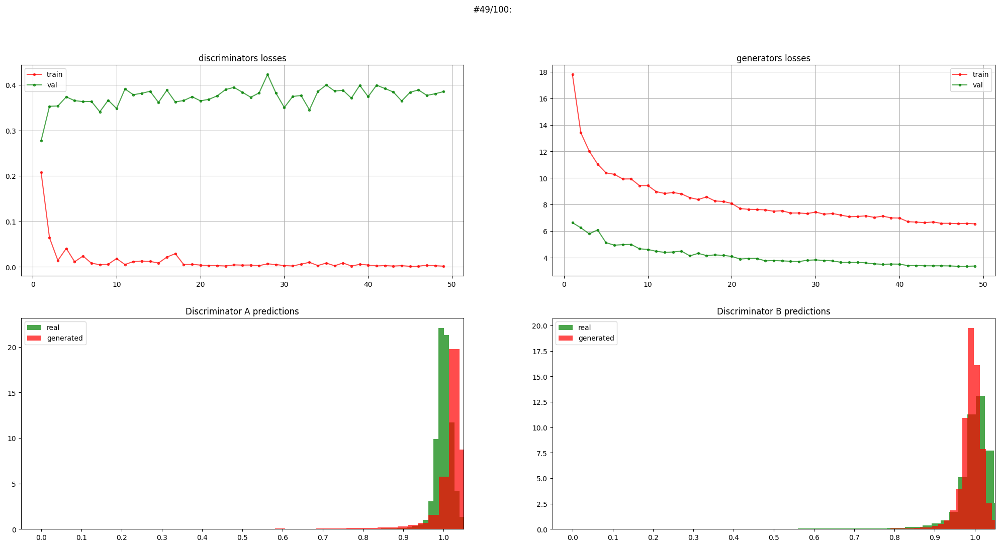

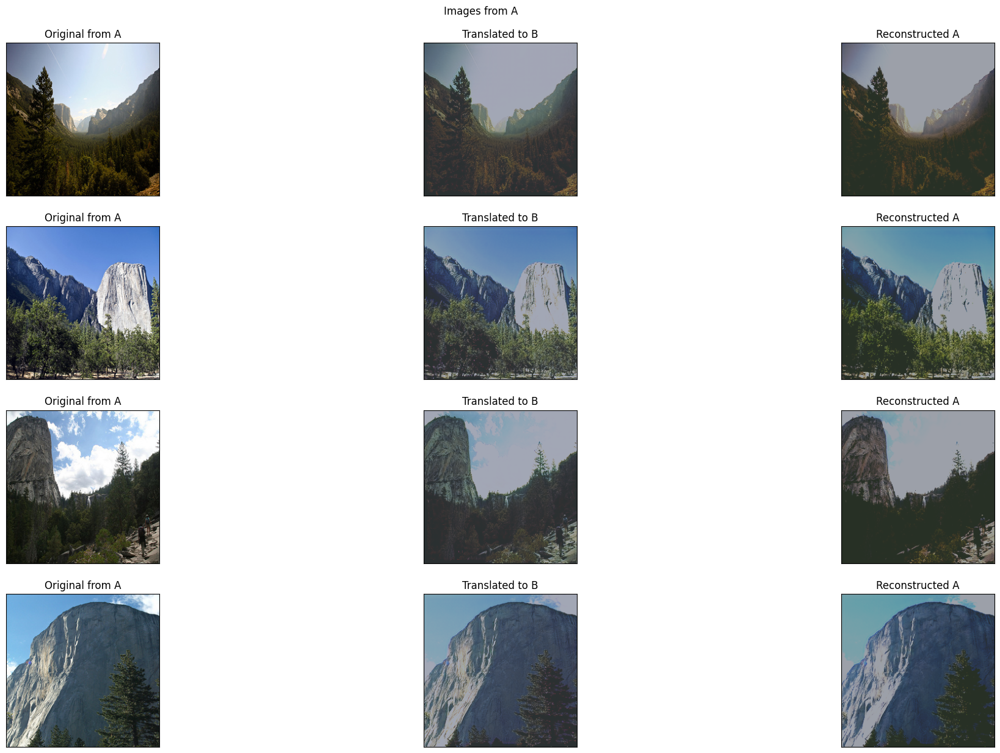

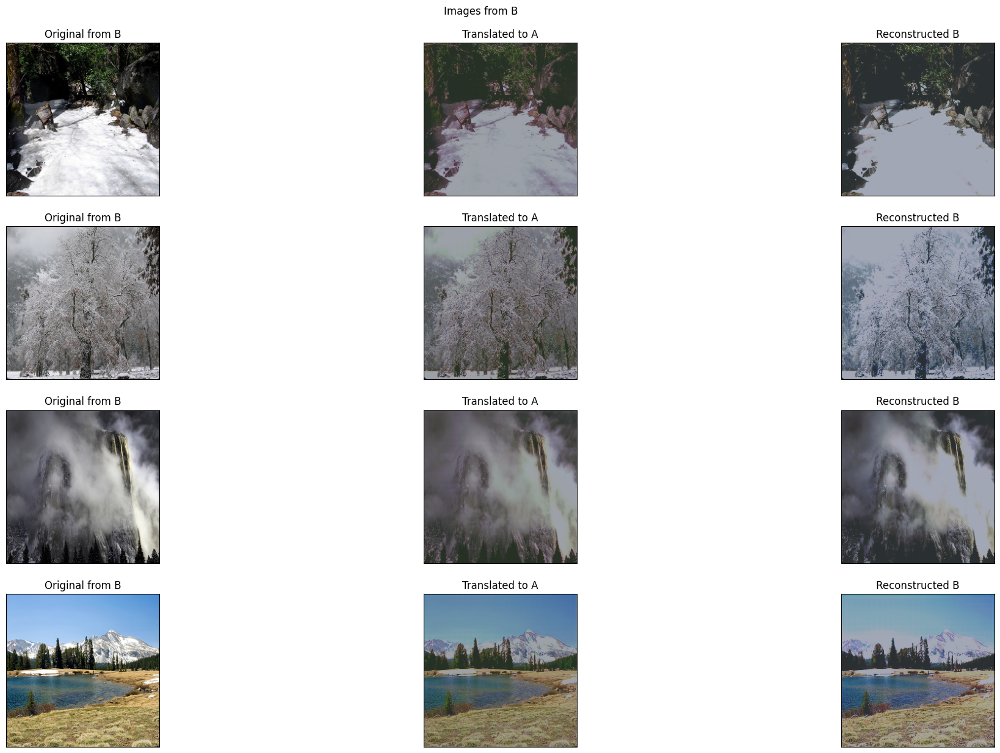

#50/100:
train discriminators (1 times)
train generators (1 times)
validate


In [ ]:
%%time
model, optimizer_d, optimizer_g, plots = learning_loop(
    model = model,
    optimizer_g = optimizer_g,
    g_iters_per_epoch = 1,
    optimizer_d = optimizer_d,
    d_iters_per_epoch = 1,
    train_loader_a = dataloaders.train_a,
    train_loader_b = dataloaders.train_b,
    val_loader_a = dataloaders.test_a,
    val_loader_b = dataloaders.test_b,
    criterion_d = criterion_d,
    criterion_g = criterion_g,
    scheduler_g = scheduler_g,
    scheduler_d = scheduler_d,
    de_norm_a = de_normalize_a,
    de_norm_b = de_normalize_b,
    epochs = 100,
    min_lr = 1e-6,
    val_every = 1,
    draw_every = 1,
    chkp_folder = "./chkp",
    model_name = "cycle_gan#11",
    images_per_validation=4,
    plots=None,
    starting_epoch=0,
)

In [24]:
# Saving
torch.save(model.state_dict(), 'model_cyclegan_dict.pth')
torch.save(model, 'model_cyclegan.pth')

In [ ]:
img_a = ds.test_a[1].to(device).unsqueeze(0)

plt.subplots(1, 2, figsize=(20, 10))

plt.subplot(121)
plt.imshow(de_normalize_a(img_a[0]))

plt.subplot(122)
plt.imshow(de_normalize_b(model.generators["a_to_b"](img_a)[0]))

plt.show()

In [ ]:
img_a = ds.test_a[5].to(device).unsqueeze(0)

plt.subplots(1, 2, figsize=(20, 10))

plt.subplot(121)
plt.imshow(de_normalize_a(img_a[0]))

plt.subplot(122)
plt.imshow(de_normalize_b(model.generators["a_to_b"](img_a)[0]))

plt.show()

In [ ]:
img_ind = 1
img_a = ds.test_a[img_ind].to(device).unsqueeze(0)
fake_b = ...(img_a)...

plt.subplots(1, 2, figsize=(20, 10))

plt.subplot(121)
plt.imshow(de_normalize_a(img_a[0]))

plt.subplot(122)
plt.imshow(de_normalize_b(fake_b))

plt.show()

In [ ]:
img_ind = 0
img_b = ds.test_b[img_ind].to(device).unsqueeze(0)
fake_a = ...(img_b)...

plt.subplots(1, 2, figsize=(20, 10))

plt.subplot(121)
plt.imshow(de_normalize_b(img_b[0]))

plt.subplot(122)
plt.imshow(de_normalize_a(fake_a))

plt.show()

# 5. Свои данные (___3 балла + бонусы___)

В этой части нужно сделать следующее:

* Собрать свой один или пару небольших датасетов (хотя бы 100 примеров, но чем больше тем лучше у вас будет качество финальной модели) - формально ограничений нет, но давайте без чего-то неадекватного или за рамками
* Обучить модель CycleGAN между вашим датасетом и каким-то ещё (либо так же вашим, либо любым существующим - полностью на вашу фантазию)
* Для сдачи задания - требуется
    * приложить ссылку на заархивированный датасет, на котором вы обучались
    * в ноутбуке сделать наглядную визуализацию данных из A и B (желательно с текстовым описанием вашей задумки)
    * в ноутбуке иметь код обучения вашей модели
    * в ноутбуке иметь визуальные результаты работы вашей модели (A в B и B в A - хотя бы по 5 примеров на каждый)
* __Задание предполагает возможность получения дополнительных баллов сверх стоимости домашки за интересные и качественные датасеты, а так же модели высокого качества__

___Удачи!___